In [53]:
# book reference: https://deeplearningmath.org/supervised-machine-learning.html
show(pwd()) 
using Pkg; Pkg.activate("."); Pkg.status()

"/mnt/c/Users/affan/OneDrive/Documents/research_profile/julia_ml_book"  Activating environment at `/mnt/c/Users/affan/OneDrive/Documents/research_profile/julia_ml_book/Project.toml`
      Status `/mnt/c/Users/affan/OneDrive/Documents/research_profile/julia_ml_book/Project.toml`
  [6e4b80f9] BenchmarkTools v1.1.0
  [587475ba] Flux v0.12.4
  [dc211083] Gnuplot v1.4.0
  [5ab0869b] KernelDensity v0.6.3
  [6f286f6a] MultivariateStats v0.8.0
  [91a5bcdd] Plots v1.18.0
  [2913bbd2] StatsBase v0.33.8
  [10745b16] Statistics


In [54]:
using Flux, Gnuplot, Flux.Data.MNIST, Statistics, BenchmarkTools, StatsBase, KernelDensity
using MultivariateStats, LinearAlgebra, Flux.Data.MNIST

In [2]:
imgs = MNIST.images() 
labels = MNIST.labels()
hcat([imgs[i] for i = 1:10]...) # print out the images

┌ Warning: Flux's datasets are deprecated, please use the package MLDatasets.jl
└ @ Flux.Data /home/affan/.julia/packages/Flux/0c9kI/src/data/Data.jl:17
┌ Warning: Flux's datasets are deprecated, please use the package MLDatasets.jl
└ @ Flux.Data /home/affan/.julia/packages/Flux/0c9kI/src/data/Data.jl:17


In [3]:
function intensity1() 
    prop0 = zeros(Float64, length(imgs))
    prop1 = zeros(Float64, length(imgs))
    meanIntensity = zeros(Float64, length(imgs))
    for (i, im) in enumerate(imgs)
        imgdata = float.(im) 
        prop0[i] = sum(imgdata .== 0) / length(imgdata)
        prop1[i] = sum(imgdata .== 1) / length(imgdata)
        meanIntensity[i] = mean(filter(x -> x > 0, float.(imgs[1])))
    end
    mp0 = mean(prop0) 
    mp1 = mean(prop1) 
    mi = mean(meanIntensity)    
    return mp0, mp1, mi
end

function intensity2() 
    # lets do it a different way by concatenating all the images together
    imgdata = hcat([vcat(float.(im)...) for im in imgs]...)    
    d, n = size(imgdata) 
    meanIntensity = mean(filter(x -> x > 0, imgdata))
    prop0 = sum(imgdata .== 0)/(d*n)
    prop1 = sum(imgdata .== 1)/(d*n)
    return prop0, prop1, meanIntensity 
end

@btime intensity1() 
#@btime intensity2()  # much slower due to hcat, vcat

  662.973 ms (1619375 allocations: 1.60 GiB)
  2.232 s (47220039 allocations: 2.49 GiB)


(0.8087977040816327, 0.006681164965986395, 0.6833624860322157)

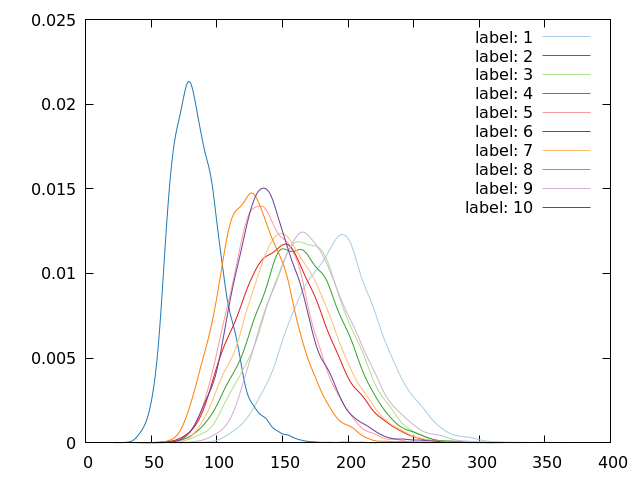

In [41]:
# lets see how many numbers we have in the dataset, this will tell if data is balanced

labelCounts = countmap(labels)

#for each label, check how many pixels are on in the corresponding figure 

function pixDensity() 
    pixCounts = zeros(Int64, 10, length(imgs)) # 10 unique labels from 0 to 9 
    for (i, im) in enumerate(imgs) 
        imgdata = float.(im) 
        lbl = labels[i]  # get the label from 0 to 9 for the corresponding image
        # since lbl is 0 ... 9 
        pixCounts[lbl + 1, i]  = length(findall(x -> x > 0, imgdata))
    end
    return pixCounts
end

pixdens = pixDensity()
#linCol = ["#000000", "#E69F00", "#56B4E9", "#009E73","#F0E442"]
linCol = ["#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99","#e31a1c","#fdbf6f","#ff7f00","#cab2d6","#6a3d9a"]
#lets plot the histogram for each label.... ie, for each label, how many non-zero pixels? 
@gp "reset" 
for i = 1:10 
    nonzeropixels = filter(x -> x > 0, pixdens[i, :])
    # this uses the hist function exported from the gnuplot pacakge 
    #h = hist(nonzeropixels, bs=5)
    #@gp :- h.bins h.counts "title 'label: $i' with lines lc '$(linCol[i])'" :- 
    
    # lets instead use a kernel density from KernelDensity.jl 
    dd_nzp = kde(nonzeropixels) 
    @gp :- dd_nzp.x dd_nzp.density "title 'label: $i' with lines lc '$(linCol[i])'" :- 
end
@gp 


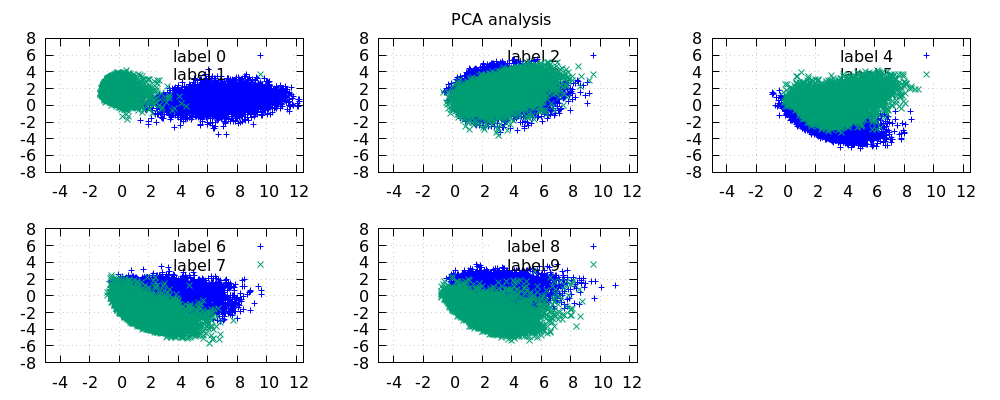

In [102]:
# we can now carry out PCA analysis 
# What is PCA?
# reduces a highly dimensional dataset to 2 dimensions that explain the majority of the variance in the data. 
# here: our dataset is the total number of images 
# the dimension is 784 (i.e there are 784 pixels that make up each image) 


# change the settings here for notebook (vscode notebook uses png, whereas jupyterlab uses html) 
Gnuplot.options.mime[MIME"image/png"] = "pngcairo enhanced size 1000,400";
Gnuplot.options.mime[MIME"text/html"] = "svg enhanced standalone mouse size 650,400";
function pca_analysis() 
    # for PCA, we need the data in a matrix form, where each column is an observation
    x = hcat([vcat(float.(im)...) for im in imgs]...)
    pca = fit(PCA, x; maxoutdim=2) # train the model 
    M = projection(pca) # Each column of the projection matrix corresponds to a principal component. 

    
    @gp "set grid"     
    @gp :- "set multiplot layout 2,3 title 'PCA analysis'" # rowsfirst margins 0.10,0.95,0.05,0.9 spacing 0.05,0.0" #l r b t
    @gp :- yrange=[-8, 8]
    @gp :- xrange=[-5, 12.5]
    
    for k = 1:5 
        labA, labB = 2k-2, 2k-1
        imA, imB = imgs[labels .== labA], imgs[labels .== labB] # lets look at the principle components of label 1 and 2 

        # convert the images we have to matrices as well, where each image is in a column
        xA = hcat([vcat(float.(im)...) for im in imA]...)
        xB = hcat([vcat(float.(im)...) for im in imB]...)

        # multiply the matrix by the projection matrix 
        zA, zB = M'*xA, M'*xB 

        # add to the multiplot 
        @gp :- k zA[1, :]  zA[2, :]   "with points title 'label $labA' lc rgb 'blue'" :- 
        @gp :- k zB[1, :]  zB[2, :]   "with points title 'label $labB'" :- 
    end    
    @gp 
end
aa = pca_analysis() #get the principle components 

# since there is significant overlap, the PCA dosn't really give us a lot of good information. 
# to do: try to get an interpretation of what this means. 

In [101]:
2

2